**카테고리 글 추천**

*Table of Contents*
1. 필요모듈 import & file read
2. 형태소 분석
3. Clustering
---

# 필요 모듈 Import & Data read

In [34]:
import numpy as np
from numpy.polynomial.polynomial import polyfit
import pandas as pd
from pandas.plotting import register_matplotlib_converters
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import seaborn as sns
from itertools import chain

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import matplotlib.style as style
import warnings
warnings.filterwarnings('ignore')

In [2]:
sns.set_style("whitegrid")

font_location = "C:\Windows\Fonts/NanumGothic.ttf"
font_name = fm.FontProperties(fname=font_location).get_name()
mpl.rc("font", family=font_name)
mpl.rcParams["font.family"]
mpl.matplotlib_fname()
plt.rcParams["figure.figsize"] = (20, 10)

In [3]:
from konlpy.tag import Kkma

# 1. Data Read

In [4]:
metadata = pd.read_json('metadata.json', lines=True)
magazine = pd.read_csv("magazine_final.csv")
users = pd.read_csv("users_final.csv")
read = pd.read_csv("read_final.csv")

In [5]:
metadata.rename(columns={"user_id": "author_id",
                         "article_id": "article_number", "id": "article_id"}, inplace=True)

In [6]:
metadata.head(3)

,magazine_id,author_id,title,keyword_list,display_url,sub_title,reg_ts,article_number,article_id
0,8982,@bookdb,"사진으로 옮기기에도 아까운, 리치필드 국립공원","[여행, 호주, 국립공원]",https://brunch.co.kr/@bookdb/782,세상 어디에도 없는 호주 Top 10,1474944427000,782,@bookdb_782
1,12081,@kohwang56,[시] 서러운 봄,"[목련꽃, 아지랑이, 동행]",https://brunch.co.kr/@kohwang56/81,,1463092749000,81,@kohwang56_81
2,0,@hannahajink,무엇을 위해,[],https://brunch.co.kr/@hannahajink/4,무엇 때문에,1447997287000,4,@hannahajink_4


In [7]:
read_metadata = pd.merge(left=read, right=metadata, left_on="article_id", right_on="article_id", how="inner")

In [8]:
read_metadata.head(3)

,dt,hr,readers_id,article_id,magazine_id,author_id,title,keyword_list,display_url,sub_title,reg_ts,article_number
0,20181001,0,#e208be4ffea19b1ceb5cea2e3c4dc32c,@kty0613_91,38720,@kty0613,좋은 이성을 만나는 기준,"[연애, 남자친구, 이성]",https://brunch.co.kr/@kty0613/91,문제는 만남의 '기회'가 아닌 만남의 '기준',1538321174000,91
1,20181001,0,#e6097910257c8b79380da50b4bce705b,@kty0613_91,38720,@kty0613,좋은 이성을 만나는 기준,"[연애, 남자친구, 이성]",https://brunch.co.kr/@kty0613/91,문제는 만남의 '기회'가 아닌 만남의 '기준',1538321174000,91
2,20181001,0,#abfa7b43a9c3f4894ca450b0436fcd38,@kty0613_91,38720,@kty0613,좋은 이성을 만나는 기준,"[연애, 남자친구, 이성]",https://brunch.co.kr/@kty0613/91,문제는 만남의 '기회'가 아닌 만남의 '기준',1538321174000,91


In [9]:
read_metadata.article_id.nunique()

476147

# 2. 형태소 분석
- read_metadata의 keyword_list 형태소 분석을 통해 정리
- Kkma 사용

In [43]:
read_metadata.head(3)

,dt,hr,readers_id,article_id,magazine_id,author_id,title,keyword_list,display_url,sub_title,reg_ts,article_number
0,20181001,0,#e208be4ffea19b1ceb5cea2e3c4dc32c,@kty0613_91,38720,@kty0613,좋은 이성을 만나는 기준,"[연애, 남자친구, 이성]",https://brunch.co.kr/@kty0613/91,문제는 만남의 '기회'가 아닌 만남의 '기준',1538321174000,91
1,20181001,0,#e6097910257c8b79380da50b4bce705b,@kty0613_91,38720,@kty0613,좋은 이성을 만나는 기준,"[연애, 남자친구, 이성]",https://brunch.co.kr/@kty0613/91,문제는 만남의 '기회'가 아닌 만남의 '기준',1538321174000,91
2,20181001,0,#abfa7b43a9c3f4894ca450b0436fcd38,@kty0613_91,38720,@kty0613,좋은 이성을 만나는 기준,"[연애, 남자친구, 이성]",https://brunch.co.kr/@kty0613/91,문제는 만남의 '기회'가 아닌 만남의 '기준',1538321174000,91


In [50]:
kkma.morphs(read_metadata['keyword_list'][0][1])

['남자', '친구']

In [57]:
read_metadata['keyword_list'][0][0]

'연애'

In [14]:
kkma = Kkma()

In [60]:
read_metadata["keyword_list"]

0             [연애, 남자친구, 이성]
1             [연애, 남자친구, 이성]
2             [연애, 남자친구, 이성]
3             [연애, 남자친구, 이성]
4             [연애, 남자친구, 이성]
                  ...       
20905035         [자본주의, 조영남]
20905036    [에세이, 위로, 공감에세이]
20905037      [사탕, 화장실, 방향제]
20905038      [사탕, 화장실, 방향제]
20905039     [세계여행, 멜버른, 일상]
Name: keyword_list, Length: 20905040, dtype: object

In [63]:
list(map(lambda x: print(x), read_metadata["keyword_list"]))

['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구', '이성']
['연애', '남자친구'

['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['총부채상환비율', '담보대출', '대출']
['주택담보대출', '담보대출', '대출한도']
['주택담보대출', '담보대출', '대출한도']
['주택담보대출', '담보대출', '대출한도']
['주택담보대출', '담보대출', '대출한도']
['주택담보대출', '담보대출', '대출한도']
['주택담보대출', '담보대출', '대출한도']
['주택담보대출', '담보대출', '대출한도']
['주택담보대출', '담보대출', '대출한도']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍', '개발자', '문과']
['프로그래밍',

['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트

['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트

['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트

['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트레스', '괴로움']
['마음', '스트

['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이', '힘']
['위로', '감성에세이

['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '카페', '음식점']
['노키즈존', '

['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공

['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공

['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공

['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공부', '독서교육']
['공부머리', '공

['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
['미국유학', '제주살이', '일렉트릭기타']
[

['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에',

['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에',

['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에',

['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에',

['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에', '브뤼셀']
['여행', '벨기에',

['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']


['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']
['에세이', '퇴사', '실패']


['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수', '취업']
['퇴사', '백수',

['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프

['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프인테리어', '신혼집']
['인테리어', '셀프

['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']
['감성에세이', '직장인', '브런치북']


['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부'

['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부'

['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부', '통역']
['영어', '영어공부'

['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']
['친구관계', '연인관계', '인간관계']


[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']
['웹툰', '엄마', '에세이']


['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장', '화제']
['메이크업', '화장'

['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑',

['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['자존감', '사랑', '심리학']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글']
['감성에세이', '감성글', '좋은글'

['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['에세이', '일기', '글']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사']
['직장', '직장인', '퇴사'

['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '

['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '자기소개서']
['이메일', '글쓰기', '

['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너', 'UX']
['작업', '디자이너'

['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']
['미국증시', '무역전쟁', '중국증시']


['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['피부', '음식', '건강']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['운동', '변비', '소화']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '소셜미디어']
['칭찬', '인간관계', '

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디', '오피스']
['스타일', '코디',

['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강'

['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강', '하루']
['다이어트', '건강'

['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음', '영어']
['영어공부', '발음'

['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행', '뉴욕']
['가을', '여행',

['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑',

['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑',

['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑',

['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑',

['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑',

['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑',

['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑',

['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑', '관계']
['연애', '사랑',

['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']
['샤넬', '메이크업', '라이프스타일']


['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱가포르', '물가']
['생활비', '싱

['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남', '고령화']
['중국', '베트남',

['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']
['디자인', 'UI', 'UX']


['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리', '랍스터']
['바닷가재', '가재요리',

['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일

['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일상', '그림일기']
['일러스트', '일

['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']
['고독', '권태', '정체성']


['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회초년생', '통장']
['재테크', '사회

['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파', '의자']
['독립', '소파',

['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결함', '폭스바겐']
['BMW', '결

['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원동기', '공기업']
['면접', '지원

['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디자이너', '업무']
['디자인', '디

['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '노트', '생산성']
['에버노트', '

['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['마음', '아픔']
['관계', '감정', '표현']
['관계', '감정', '표현']
['관계', '감정', '표현']
['관계', '감정', '표현']
['관계', '감정', '표현']
['관계', '감정', '표현']
['관계', '감정', '표현']
['관계', '감정', '표현']
['사랑', '연애', '소원']
['사랑', '연애', '소원']
['사랑', '연애', '소원']
['사랑', '연애', '소원']
['사랑', '연애', '소원']
['사랑', '연애', '소원']
['사랑', '연애', '소원']
['사랑', '연애', '소원']
['사랑', '연애', '소원']
['사랑', '연애', '소원']
['사랑', '연애', '소원']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['이별', '혼자사랑', '추억']
['사랑', '생각']
['사랑', '생각']
['사랑', '생각']
['사랑', '생각']
['사랑', '생각']
['사랑', '생각']
['사랑', '생각']
['사랑', '생각']
['사랑', '생각']
['사랑', '생각']
['사랑

['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']
['와이프', '꼬리', '장어']


['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']
['사랑', '연애', '에세이']


['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']
['힙업운동', '다이어트', '하체운동']


['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'UI', '스타트업']
['디자인', 'U

['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']


['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']


['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']
['편의점', '커피', '담배']


['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크', '사회초년생']
['포기', '재테크

['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션'

['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션'

['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션'

['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션'

['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션', '옷']
['브랜드', '패션'

['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']
['저축', '경제', '재테크']


['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수', '매도']
['주식', '매수',

['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행', '공원']
['뉴욕', '여행',

['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일'

['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일'

['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일'

['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일'

['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일'

['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일'

['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['원피스', '스타일', '독일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['카페', '연남동', '평일']
['

['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹맘', '자기계발']
['엄마', '워킹

['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', '독립서점']
['책방', '서점', 

['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['마케팅', '전략', '책']
['글쓰기', '책', '조각']
['글쓰기', '책', '조각']
['글쓰기', '책', '조각']
['책', '도서', '독서']
['책', '도서', '독서']
['책', '도서', '독서']
['책', '도서', '독서']
['책', '도서', '독서']
['책', '도서', '독서']
['책', '도서', '독서']
['책', '도서', '독서']
['책', '도서', '독서']
['책', '도서', '독서']
['책', '도서', '독서']
['책'

['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생', '영감']
['명언', '인생',

['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']
['비행', '고찰', '승무원']


['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역', '통역사']
['드라마', '통역',

['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['명예', '유재석']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실']
['거짓말', '거짓', '진실'

['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플', 'iOS']
['아이폰', '애플',

['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제',

['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제', '퀴즈']
['코딩', '문제',

['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서', '취준생']
['취업', '자소서',

['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']
['육아에세이', '감성에세이', '사랑']


['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원', '대학']
['대학원'

['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복', '당신']
['사랑', '행복',

['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애',

['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애',

['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애',

['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애',

['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애',

['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애', '상처']
['사랑', '연애',

['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', 

['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', 

['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', '부산', '결혼']
['부부상담센터', 

['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']

['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']
['생각', '독서']

['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애'

['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애'

['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애', '사랑']
['남녀차이', '연애'

['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼'

['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼'

['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼', '사랑']
['결혼생활', '결혼'

['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러스트', '사기꾼']
['소원', '일러

['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지', '휴가']
['해외여행', '해외여행지'

['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', 

['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', 

['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', '이직', '로또']
['커뮤니케이션', 

['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애',

['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애',

['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애',

['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애', '와인']
['소주', '연애',

['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설',

['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설',

['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설', '사랑']
['연애', '소설',

[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
[

['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']
['마케팅', '뷰티', '창업']


['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']
['독일', '패션', '옷차림']


['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축', '주택청약종합저축', '디딤돌대출']
['주택청약저축

['카페', '인스타그램', '커피']
['카페', '인스타그램', '커피']
['카페', '인스타그램', '커피']
['카페', '인스타그램', '커피']
['카페', '인스타그램', '커피']
['카페', '인스타그램', '커피']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스타그램', 'SNS', '인스타']
['인스

['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['직장인', '자기계발', '성장']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유시민', '박종철']
['정치', '유

['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생', '경험']
['자소서', '취준생'

['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기소개서', '채용']
['자소서', '자기

['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계여행', '에세이']
['그림', '세계

['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이', '멜버른']
['이민', '워킹홀리데이',

['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['창비', '강의', '명화']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', '칸트', '순수이성']
['철학', 

['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건

['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건

['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건

['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건강', '탄산음료']
['탄산수', '건

['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']
['셀프인테리어', '인테리어', '건축']


['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['사랑', '언어']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자

['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기소개서', '경험']
['자소서', '자기

['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
['연방준비제도', '금리인상', '국채금리']
[

['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장',

['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장', '재테크']
['환율', '외화예금통장',

KeyboardInterrupt: 

In [61]:
ls=list(read_metadata["keyword_list"])
list(map(lambda x: kkma.morphs(x),read_metadata["keyword_list"]))
#read_metadata["keyword"] = read_metadata["keyword_list"].apply(map(lambda x: kkma.morphs(x), x))

TypeError: No matching overloads found for kr.lucypark.kkma.KkmaInterface.morphAnalyzer(list), options are:
	public java.util.List kr.lucypark.kkma.KkmaInterface.morphAnalyzer(java.lang.String) throws java.lang.Exception



In [42]:
def morphs_analysis(data):
    ls = []
    for x in range(len(data)):
        ls.append(kkma.morphs(data[x]))
    return list(chain.from_iterable(ls))

In [43]:
a=morphs_analysis(["연애", "남자친구", "이성"])

In [44]:
a

['연애', '남자', '친구', '이성']

In [48]:
read_metadata2 = read_metadata[['article_id', 'keyword_list']]

In [49]:
read_metadata2.drop_duplicates('article_id', ignore_index=True, inplace=True)

In [51]:
read_metadata2

,article_id,keyword_list
0,@kty0613_91,"[연애, 남자친구, 이성]"
1,@miamiyoung_31,"[금융상품, 보험, 금융]"
2,@banksalad_49,"[재테크, 적금]"
3,@rlfrjsdn_95,"[대출금리, 디딤돌대출, 신혼부부]"
4,@readme999_140,"[신용대출, 마이너스통장, 은행대출금리]"
...,...,...
476142,@ine209_36,"[리뷰, 단편소설, 관계]"
476143,@marupress_187,"[자본주의, 조영남]"
476144,@angaekkot_9,"[에세이, 위로, 공감에세이]"
476145,@mwwritings_30,"[사탕, 화장실, 방향제]"


In [56]:
read_metadata2['k_list'] = read_metadata2["keyword_list"].apply(lambda x: morphs_analysis(x))

In [57]:
read_metadata2['k_list']

0                       [연애, 남자, 친구, 이성]
1                       [금융, 상품, 보험, 금융]
2                              [재테크, 적금]
3                [대출, 금리, 디딤돌, 대출, 신혼부부]
4         [신용, 대출, 마이너스, 통장, 은행, 대출, 금리]
                       ...              
476142                  [리뷰, 단편, 소설, 관계]
476143                     [자본주의, 조, 영남]
476144            [에세이, 위로, 공감, 에, 세, 이]
476145                    [사탕, 화장실, 방향제]
476146                 [세계, 여행, 멜버른, 일상]
Name: k_list, Length: 476147, dtype: object

In [64]:
metadata['keyword_list_literal'].dropna()

0                    연애 남자 친구 이성
1                    금융 상품 보험 금융
2                         재테크 적금
3              대출 금리 디딤돌 대출 신혼부부
4         신용 대출 마이너스 통장 은행 대출 금리
                   ...          
476142               리뷰 단편 소설 관계
476143                 자본주의 조 영남
476144           에세이 위로 공감 에 세 이
476145                사탕 화장실 방향제
476146              세계 여행 멜버른 일상
Name: keyword_list_literal, Length: 476147, dtype: object

In [65]:
# keyword_list 유사도 측정 (countvectorizer을 이용해서 빈도수로 벡터화)
from sklearn.feature_extraction.text import CountVectorizer

# CountVectorizer를 적용하기 위해 공백문자로 word 단위가 구분되는 문자열로 변환
metadata["keyword_list_literal"] = read_metadata2['k_list'].apply(lambda x: (" ").join(x))
metadata["keyword_list_literal"].dropna(inplace=True)
# 이를 적용해 개별 요소를 공백 문자로 구분하는 문자열로 변환해 별도의 칼럼인 keyword_list_literal 칼럼으로 저장

count_vect = CountVectorizer(min_df=0, ngram_range=(1,3)) 
# min_df : 최소 빈도수(최소 노출 빈도수 정해주는 것), ngram_range: 토큰화 단어갯수
keyword_mat = count_vect.fit_transform(metadata["keyword_list_literal"])
print(keyword_mat.shape)
# 643104 레코드와 1088182개의 개별 단어 피처로 구성된 피처 벡터 행렬이 만들어짐

(476147, 805422)


In [66]:
# 코사인 유사도 구하기
from sklearn.metrics.pairwise import cosine_similarity

keyword_sim = cosine_similarity(keyword_mat, keyword_mat)
print(keyword_sim.shape)
print(keyword_sim[:10])

MemoryError: Unable to allocate 42.1 GiB for an array with shape (5650531660,) and data type float64

In [68]:
from sklearn.cluster import KMeans

In [70]:
#K-means

model = KMeans(n_clusters=8)
model.fit(keyword_mat)
print(model.labels_)
y_predict = model.predict(keyword_mat)
print(y_predict)

[3 3 3 ... 3 3 2]
[3 3 3 ... 3 3 2]


In [75]:
y_predict

3

ValueError: setting an array element with a sequence.

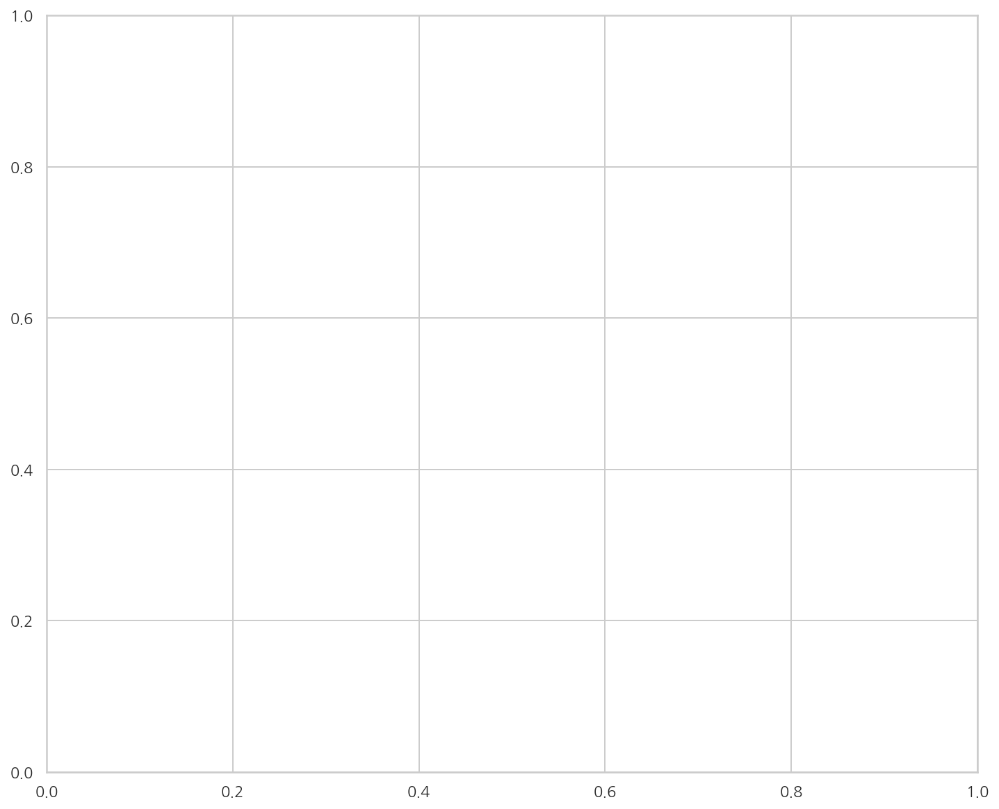

In [74]:
plt.figure(figsize=(12,10))
plt.scatter(keyword_mat[y_predict==0, 0], keyword_mat[y_predict == 0, 1], s=100, c = 'red', label='cluster1')

In [148]:
#ls = ["[", "]", "'", ","]
#read_metadata["keyword"] = read_metadata["keyword_list"].apply(lambda x: kkma.morphs(x))
#for num in range(len(read_metadata)):
#    read_metadata["keyword"][num]=[keyword for keyword in read_metadata["keyword"][num] if keyword not in ls]

KeyboardInterrupt: 

In [16]:
#read_metadata["keyword_list_literal"] = read_metadata["keyword_list"].apply(lambda x: (" ").join(x))

### 글별 매핑 되는 키워드
article_keyword_map= read_metadata[['article_id', "keyword_list"]]

# basket
article_keyword_map_unnest = np.dstack((np.repeat(article_keyword_map.article_id.values, 
                                                  list(map(len, article_keyword_map.keyword_list))),
                                        np.concatenate(article_keyword_map.keyword_list.values)))

# unnested 데이터프레임 생성 : song_gnr_map
article_keyword_map = pd.DataFrame(data = article_keyword_map_unnest[0], columns=article_keyword_map.columns)
article_keyword_map["article_id"] = article_keyword_map["article_id"].astype(str)

# unnest 객체 제거
del article_keyword_map_unnest

In [17]:
article_keyword_map

,article_id,keyword_list
0,@kty0613_91,연애
1,@kty0613_91,남자친구
2,@kty0613_91,이성
3,@kty0613_91,연애
4,@kty0613_91,남자친구
...,...,...
58940178,@mwwritings_30,화장실
58940179,@mwwritings_30,방향제
58940180,@saeromjoung_7,세계여행
58940181,@saeromjoung_7,멜버른


In [20]:
keyword_ls = article_keyword_map['keyword_list'].drop_duplicates().reset_index(drop=True)

In [39]:
keyword_ls[:100]

0       연애
1     남자친구
2       이성
3     금융상품
4       보험
      ... 
95    연애상담
96    연인사이
97      동생
98      소주
99     영등포
Name: keyword_list, Length: 100, dtype: object

In [25]:
# keyword_list 유사도 측정 (countvectorizer을 이용해서 빈도수로 벡터화)
from sklearn.feature_extraction.text import CountVectorizer

# CountVectorizer를 적용하기 위해 공백문자로 word 단위가 구분되는 문자열로 변환
# metadata["keyword_list_literal"] = metadata["keyword_list"].apply(lambda x: (" ").join(x))
# 이를 적용해 개별 요소를 공백 문자로 구분하는 문자열로 변환해 별도의 칼럼인 keyword_list_literal 칼럼으로 저장

count_vect = CountVectorizer(min_df=0, ngram_range=(1,3)) 
# min_df : 최소 빈도수(최소 노출 빈도수 정해주는 것), ngram_range: 토큰화 단어갯수
keyword_mat = count_vect.fit_transform(keyword_ls)
print(keyword_mat.shape)
# 643104 레코드와 1088182개의 개별 단어 피처로 구성된 피처 벡터 행렬이 만들어짐

(71107, 71004)


In [28]:
# 코사인 유사도 구하기
from sklearn.metrics.pairwise import cosine_similarity

keyword_sim = cosine_similarity(keyword_mat, keyword_mat)
print(keyword_sim.shape)
print(keyword_sim[:10])

MemoryError: Unable to allocate 37.7 GiB for an array with shape (71107, 71107) and data type float64

In [37]:
keyword_sim

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [40]:
keyword_ls

0             연애
1           남자친구
2             이성
3           금융상품
4             보험
          ...   
71102         굴복
71103       수제쿠키
71104    머리염색전문점
71105      스마트뱅킹
71106       노각무침
Name: keyword_list, Length: 71107, dtype: object